In [ ]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="hmWwD633kHXznyTfDqQS")
project = rf.workspace("fa-ived-iqrcg").project("flood-segmentation-vapdu")
version = project.version(10)
dataset = version.download("png-mask-semantic")

In [ ]:
pip install pytorch-lightning transformers datasets roboflow==0.2.7

In [ ]:
pip install evaluate


In [ ]:
pip install pytorch-lightning


In [ ]:
import pytorch_lightning as pl
from pytorch_lightning.callbacks.early_stopping import EarlyStopping
from pytorch_lightning.callbacks.model_checkpoint import ModelCheckpoint
from pytorch_lightning.loggers import CSVLogger
from transformers import SegformerFeatureExtractor, SegformerForSemanticSegmentation,SegformerImageProcessor
from evaluate import load
import torch
from torch import nn
from torch.utils.data import Dataset, DataLoader
import os
from PIL import Image
import numpy as np
import random
from torch.optim import Adam

In [ ]:
class SemanticSegmentationDataset(Dataset):
    """Image (semantic) segmentation dataset."""

    def __init__(self, root_dir, feature_extractor):
        """
        Args:
            root_dir (string): Root directory of the dataset containing the images + annotations.
            feature_extractor (SegFormerFeatureExtractor): feature extractor to prepare images + segmentation maps.
            train (bool): Whether to load "training" or "validation" images + annota SegformerForSemanticSegmentationtions.
        """
        self.root_dir = root_dir
        self.feature_extractor = feature_extractor

        self.classes_csv_file = os.path.join(self.root_dir, "_classes.csv")
        with open(self.classes_csv_file, 'r') as fid:
            data = [l.split(',') for i,l in enumerate(fid) if i !=0]
        self.id2label = {x[0]:x[1] for x in data}

        image_file_names = [f for f in os.listdir(self.root_dir) if '.jpg' in f]
        mask_file_names = [f for f in os.listdir(self.root_dir) if '.png' in f]

        self.images = sorted(image_file_names)
        self.masks = sorted(mask_file_names)

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):

        image = Image.open(os.path.join(self.root_dir, self.images[idx]))
        segmentation_map = Image.open(os.path.join(self.root_dir, self.masks[idx]))

        # randomly crop + pad both image and segmentation map to same size
        encoded_inputs = self.feature_extractor(image, segmentation_map, return_tensors="pt")

        for k,v in encoded_inputs.items():
          encoded_inputs[k].squeeze_() # remove batch dimension

        return encoded_inputs

In [ ]:
class SegformerFinetuner(pl.LightningModule):

    def __init__(self, id2label, train_dataloader=None, val_dataloader=None, test_dataloader=None, metrics_interval=100):
        super().__init__()
        self.id2label = id2label
        self.metrics_interval = metrics_interval
        self.train_dl = train_dataloader
        self.val_dl = val_dataloader
        self.test_dl = test_dataloader

        self.num_classes = len(id2label.keys())
        self.label2id = {v:k for k,v in self.id2label.items()}

        self.model = SegformerForSemanticSegmentation.from_pretrained(
            "nvidia/segformer-b5-finetuned-cityscapes-1024-1024",
            return_dict=False,
            num_labels=self.num_classes,
            id2label=self.id2label,
            label2id=self.label2id,
            ignore_mismatched_sizes=True,
        )

        self.train_mean_iou = load("mean_iou")
        self.val_mean_iou = load("mean_iou")
        self.test_mean_iou = load("mean_iou")

        # Store validation/test outputs manually
        self._val_losses = []
        self._test_losses = []

    def forward(self, images, masks):
        return self.model(pixel_values=images, labels=masks)

    def training_step(self, batch, batch_nb):
        images, masks = batch['pixel_values'], batch['labels']
        loss, logits = self(images, masks)

        upsampled_logits = nn.functional.interpolate(
            logits,
            size=masks.shape[-2:],
            mode="bilinear",
            align_corners=False
        )

        predicted = upsampled_logits.argmax(dim=1)
        self.train_mean_iou.add_batch(
            predictions=predicted.detach().cpu().numpy(),
            references=masks.detach().cpu().numpy()
        )

        if batch_nb % self.metrics_interval == 0:
            metrics = self.train_mean_iou.compute(
                num_labels=self.num_classes,
                ignore_index=255,
                reduce_labels=False,
            )
            metrics = {'loss': loss, "mean_iou": metrics["mean_iou"], "mean_accuracy": metrics["mean_accuracy"]}
            for k, v in metrics.items():
                self.log(k, v)
            return metrics
        else:
            return {'loss': loss}

    def validation_step(self, batch, batch_nb):
        images, masks = batch['pixel_values'], batch['labels']
        loss, logits = self(images, masks)

        upsampled_logits = nn.functional.interpolate(
            logits,
            size=masks.shape[-2:],
            mode="bilinear",
            align_corners=False
        )
        predicted = upsampled_logits.argmax(dim=1)
        self.val_mean_iou.add_batch(
            predictions=predicted.detach().cpu().numpy(),
            references=masks.detach().cpu().numpy()
        )

        self._val_losses.append(loss.detach())
        return {'val_loss': loss}

    def on_validation_epoch_end(self):
        # compute metrics manually
        avg_val_loss = torch.stack(self._val_losses).mean()
        metrics = self.val_mean_iou.compute(
            num_labels=self.num_classes,
            ignore_index=255,
            reduce_labels=False,
        )

        self.log_dict({
            "val_loss": avg_val_loss,
            "val_mean_iou": metrics["mean_iou"],
            "val_mean_accuracy": metrics["mean_accuracy"]
        })

        # clear stored losses
        self._val_losses.clear()

    def test_step(self, batch, batch_nb):
        images, masks = batch['pixel_values'], batch['labels']
        loss, logits = self(images, masks)

        upsampled_logits = nn.functional.interpolate(
            logits,
            size=masks.shape[-2:],
            mode="bilinear",
            align_corners=False
        )
        predicted = upsampled_logits.argmax(dim=1)
        self.test_mean_iou.add_batch(
            predictions=predicted.detach().cpu().numpy(),
            references=masks.detach().cpu().numpy()
        )

        self._test_losses.append(loss.detach())
        return {'test_loss': loss}

    def on_test_epoch_end(self):
        avg_test_loss = torch.stack(self._test_losses).mean()
        metrics = self.test_mean_iou.compute(
            num_labels=self.num_classes,
            ignore_index=255,
            reduce_labels=False,
        )

        self.log_dict({
            "test_loss": avg_test_loss,
            "test_mean_iou": metrics["mean_iou"],
            "test_mean_accuracy": metrics["mean_accuracy"]
        })

        self._test_losses.clear()

    def configure_optimizers(self):
        return torch.optim.Adam([p for p in self.parameters() if p.requires_grad], lr=2e-5, eps=1e-8)

    def train_dataloader(self):
        return self.train_dl

    def val_dataloader(self):
        return self.val_dl

    def test_dataloader(self):
        return self.test_dl


In [ ]:
feature_extractor = SegformerFeatureExtractor.from_pretrained("nvidia/segformer-b5-finetuned-cityscapes-1024-1024")
feature_extractor.reduce_labels = False
feature_extractor.size = 128

train_dataset = SemanticSegmentationDataset(f"{dataset.location}/train/", feature_extractor)
val_dataset = SemanticSegmentationDataset(f"{dataset.location}/valid/", feature_extractor)
test_dataset = SemanticSegmentationDataset(f"{dataset.location}/test/", feature_extractor)

batch_size = 8
num_workers = 2
train_dataloader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=num_workers)
val_dataloader = DataLoader(val_dataset, batch_size=batch_size, num_workers=num_workers)
test_dataloader = DataLoader(test_dataset, batch_size=batch_size, num_workers=num_workers)

segformer_finetuner = SegformerFinetuner(
    train_dataset.id2label,
    train_dataloader=train_dataloader,
    val_dataloader=val_dataloader,
    test_dataloader=test_dataloader,
    metrics_interval=10,
)

Some weights of SegformerForSemanticSegmentation were not initialized from the model checkpoint at nvidia/segformer-b5-finetuned-cityscapes-1024-1024 and are newly initialized because the shapes did not match:
- decode_head.classifier.weight: found shape torch.Size([19, 768, 1, 1]) in the checkpoint and torch.Size([12, 768, 1, 1]) in the model instantiated
- decode_head.classifier.bias: found shape torch.Size([19]) in the checkpoint and torch.Size([12]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [ ]:
early_stop_callback = EarlyStopping(
    monitor="val_loss",
    min_delta=0.00,
    patience=10,
    verbose=False,
    mode="min",
)

checkpoint_callback = ModelCheckpoint(save_top_k=1, monitor="val_loss")

trainer = pl.Trainer(
    accelerator="gpu",   # or "cpu"
    devices=1,           # number of GPUs
    callbacks=[early_stop_callback, checkpoint_callback],
    max_epochs=50
)
trainer.fit(segformer_finetuner)

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name  | Type                             | Params | Mode
------------------------------------------------------------------
0 | model | SegformerForSemanticSegmentation | 84.6 M | eval
------------------------------------------------------------------
84.6 M    Trainable params
0         Non-trainable params
84.6 M    Total params
338.410   Total estimated model params size (MB)
0         Modules in train mode
1179      Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Downcasting array dtype int64 to int32 to be compatible with 'Pillow'
invalid value encountered in divide
/usr/local/lib/python3.12/dist-packages/pytorch_lightning/loops/fit_loop.py:527: Found 1179 module(s) in eval mode at the start of training. This may lead to unexpected behavior during training. If this is intentional, you can ignore this warning.


Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

invalid value encountered in divide


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=50` reached.


In [ ]:
%load_ext tensorboard
%tensorboard --logdir lightning_logs/

<IPython.core.display.Javascript object>

In [ ]:
res = trainer.test(ckpt_path="best")

INFO:pytorch_lightning.utilities.rank_zero:Restoring states from the checkpoint path at /content/lightning_logs/version_7/checkpoints/epoch=46-step=2632.ckpt
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.utilities.rank_zero:Loaded model weights from the checkpoint at /content/lightning_logs/version_7/checkpoints/epoch=46-step=2632.ckpt


Testing: |          | 0/? [00:00<?, ?it/s]

Downcasting array dtype int64 to int32 to be compatible with 'Pillow'
invalid value encountered in divide
invalid value encountered in divide


┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test_loss         │    0.07610712945461273    │
│    test_mean_accuracy     │    0.3658582270145416     │
│       test_mean_iou       │    0.3044204115867615     │
└───────────────────────────┴───────────────────────────┘

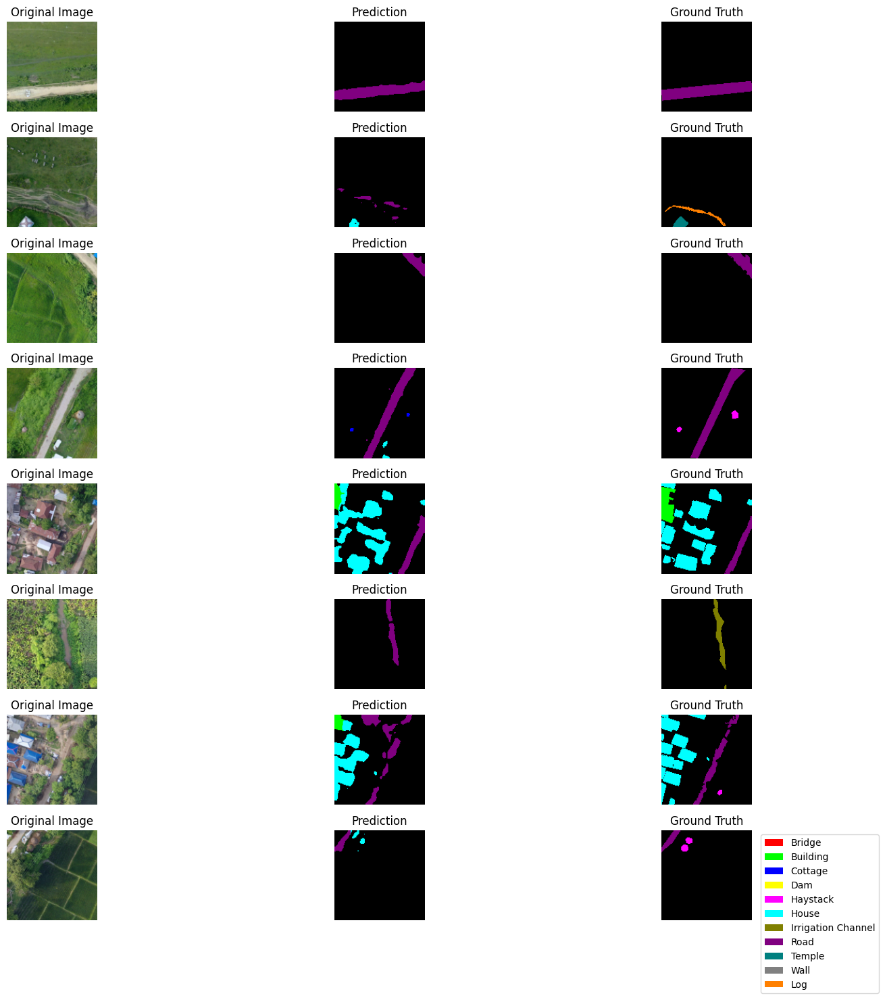

In [ ]:
import numpy as np
import torch.nn as nn
from PIL import Image
import matplotlib.pyplot as plt
from matplotlib.patches import Patch

# --- Define classes and colors (skip background in legend) ---
classes = [
    "Bridge", "Building", "Cottage", "Dam", "Haystack",
    "House", "Irrigation Channel", "Road", "Temple", "Wall", "Log"
]

color_map = {
    1: (255, 0, 0),         # Bridge
    2: (0, 255, 0),         # Building
    3: (0, 0, 255),         # Cottage
    4: (255, 255, 0),       # Dam
    5: (255, 0, 255),       # Haystack
    6: (0, 255, 255),       # House
    7: (128, 128, 0),       # Irrigation Channel
    8: (128, 0, 128),       # Road
    9: (0, 128, 128),       # Temple
    10: (128, 128, 128),    # Wall
    11: (255, 128, 0),      # Log
}

# --- Convert prediction/mask to RGB ignoring background ---
def prediction_to_vis(prediction):
    vis_shape = prediction.shape + (3,)
    vis = np.zeros(vis_shape, dtype=np.uint8)
    for i, c in color_map.items():
        vis[prediction == i] = c
    return Image.fromarray(vis)

# --- Loop through test dataloader ---
all_images = []
all_predictions = []
all_masks = []

for batch in test_dataloader:
    images, masks = batch['pixel_values'], batch['labels']
    outputs = segformer_finetuner.model(images, masks)

    loss, logits = outputs[0], outputs[1]

    upsampled_logits = nn.functional.interpolate(
        logits,
        size=masks.shape[-2:],
        mode="bilinear",
        align_corners=False
    )

    predicted_mask = upsampled_logits.argmax(dim=1).cpu().numpy()
    masks = masks.cpu().numpy()
    images = images.cpu().numpy().transpose(0,2,3,1)  # CHW → HWC for visualization

    all_images.append(images)
    all_predictions.append(predicted_mask)
    all_masks.append(masks)

# --- Visualization ---
n_plots = 8  # number of samples to show
f, axarr = plt.subplots(n_plots, 3, figsize=(18, 15))

for i in range(n_plots):
    # Original image
    img = all_images[0][i]
    img = (img - img.min()) / (img.max() - img.min())  # normalize to 0-1 for plt
    axarr[i,0].imshow(img)
    axarr[i,0].set_title("Original Image")
    axarr[i,0].axis('off')

    # Predicted mask
    pred_vis = prediction_to_vis(all_predictions[0][i])
    axarr[i,1].imshow(pred_vis)
    axarr[i,1].set_title("Prediction")
    axarr[i,1].axis('off')

    # Ground truth mask
    mask_vis = prediction_to_vis(all_masks[0][i])
    axarr[i,2].imshow(mask_vis)
    axarr[i,2].set_title("Ground Truth")
    axarr[i,2].axis('off')

# --- Legend (skip background) ---
legend_elements = [Patch(facecolor=np.array(c)/255.0, label=cls) for cls, c in zip(classes, color_map.values())]
plt.legend(handles=legend_elements, bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


In [ ]:
import os
import torch
from PIL import Image
import numpy as np

# --- Select test image ---
test_idx = 3
input_image_file = os.path.join(test_dataset.root_dir, test_dataset.images[test_idx])
input_image = Image.open(input_image_file).convert("RGB")  # keep RGB

# --- Get model prediction ---
test_batch = test_dataset[test_idx]
images, masks = test_batch['pixel_values'], test_batch['labels']

# Add batch dimension
images = torch.unsqueeze(images, 0)
masks = torch.unsqueeze(masks, 0)

# Forward pass
outputs = segformer_finetuner.model(images, masks)
loss, logits = outputs[0], outputs[1]

# Upsample logits to mask size
upsampled_logits = torch.nn.functional.interpolate(
    logits,
    size=masks.shape[-2:],
    mode="bilinear",
    align_corners=False
)

# Get predicted mask
predicted_mask = upsampled_logits.argmax(dim=1).cpu().numpy()[0]

# --- Convert predicted mask to RGB ---
def prediction_to_vis(prediction):
    color_map = {
        1: (255, 0, 0),         # Bridge
        2: (0, 255, 0),         # Building
        3: (0, 0, 255),         # Cottage
        4: (255, 255, 0),       # Dam
        5: (255, 0, 255),       # Haystack
        6: (0, 255, 255),       # House
        7: (128, 128, 0),       # Irrigation Channel
        8: (128, 0, 128),       # Road
        9: (0, 128, 128),       # Temple
        10: (128, 128, 128),    # Wall
        11: (255, 128, 0),      # Log
    }
    vis = np.zeros(prediction.shape + (3,), dtype=np.uint8)
    for i, c in color_map.items():
        vis[prediction == i] = c
    return Image.fromarray(vis)

mask_rgb = prediction_to_vis(predicted_mask)

# --- Resize mask using NEAREST to avoid blurring ---
mask_rgb = mask_rgb.resize(input_image.size, resample=Image.NEAREST)

# --- Overlay mask on image using composite for sharp edges ---
overlay_img = Image.composite(mask_rgb, input_image, mask_rgb.convert("L"))
overlay_img.show()


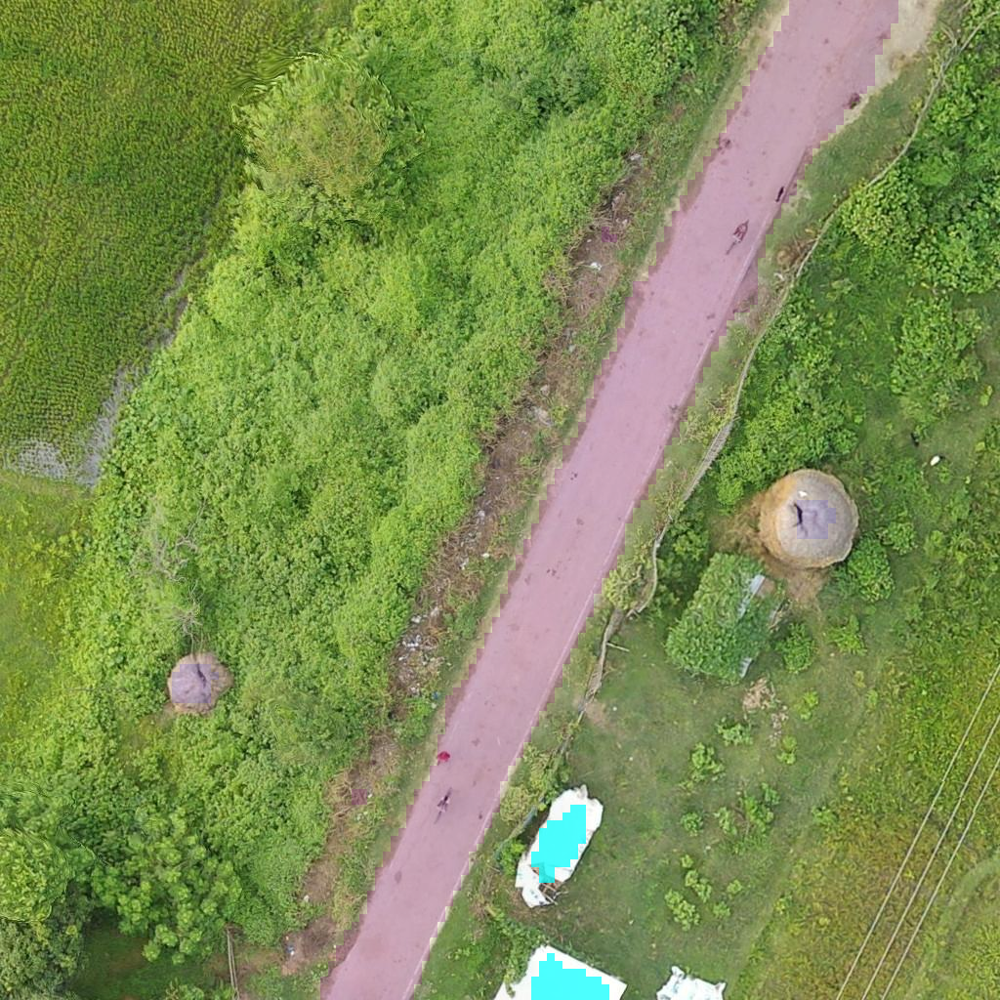

In [ ]:
overlay_img

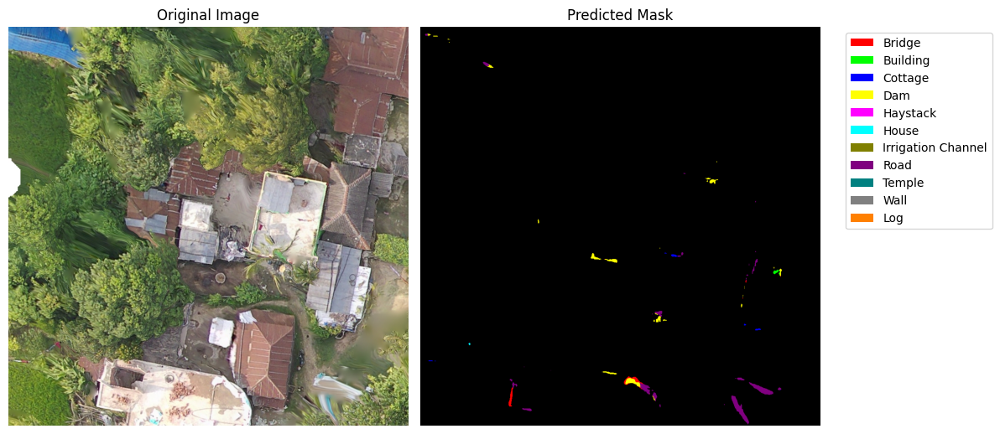

In [ ]:
import numpy as np
import torch
from PIL import Image
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import torch.nn as nn

# --- Load your image ---
img_path = "/content/tile_32768_20480.png"  # Replace with your image path
img = Image.open(img_path).convert("RGB")

# --- Preprocess image ---
# Assuming your model expects CHW and normalized tensors
img_np = np.array(img) / 255.0  # Normalize to 0-1
img_tensor = torch.tensor(img_np.transpose(2,0,1), dtype=torch.float32).unsqueeze(0)  # Add batch dim

# --- Get the device of your model ---
device = next(segformer_finetuner.model.parameters()).device

# --- Send input to the same device ---
img_tensor = img_tensor.to(device)

# --- Run through the model ---
with torch.no_grad():
    outputs = segformer_finetuner.model(img_tensor)
    logits = outputs[0] if isinstance(outputs, (list, tuple)) else outputs
    upsampled_logits = nn.functional.interpolate(
        logits,
        size=img_np.shape[:2],  # H, W
        mode="bilinear",
        align_corners=False
    )
    predicted_mask = upsampled_logits.argmax(dim=1).cpu().numpy()[0]  # move back to CPU for visualization

# --- Convert prediction to RGB ---
def prediction_to_vis(prediction):
    vis_shape = prediction.shape + (3,)
    vis = np.zeros(vis_shape, dtype=np.uint8)
    for i, c in color_map.items():
        vis[prediction == i] = c
    return Image.fromarray(vis)

pred_vis = prediction_to_vis(predicted_mask)

# --- Display ---
plt.figure(figsize=(12,6))
plt.subplot(1,2,1)
plt.imshow(img_np)
plt.title("Original Image")
plt.axis('off')

plt.subplot(1,2,2)
plt.imshow(pred_vis)
plt.title("Predicted Mask")
plt.axis('off')

# --- Legend ---
legend_elements = [Patch(facecolor=np.array(c)/255.0, label=cls) for cls, c in zip(classes, color_map.values())]
plt.legend(handles=legend_elements, bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


In [ ]:
import shutil

shutil.make_archive('/content/Flood-Segmentation-10/test', 'zip', 'lightning_logs')


'/content/Flood-Segmentation-10/test.zip'

In [ ]:
from google.colab import drive
drive.mount('/content/drive')